# Importing libraries

In [37]:
import face_recognition
import numpy as np
from PIL import Image
import glob
#import cv2
import time
from tqdm import tqdm
%matplotlib inline

# Loading Facenet model (Not using at the moment)

In [3]:
from keras.models import load_model
model = load_model('facenet_keras.h5')
print('Model Loaded')

Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Model Loaded


C:\Users\Arka_Thesis\Anaconda3\lib\site-packages\keras\engine\saving.py:310: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [4]:
print(model.inputs)
print(model.outputs)

[<tf.Tensor 'input_1:0' shape=(?, 160, 160, 3) dtype=float32>]
[<tf.Tensor 'Bottleneck_BatchNorm/cond/Merge:0' shape=(?, 128) dtype=float32>]


# Getting the face embeddings and storing them in a Dictionary

In [113]:

d={}
i=0
Encodings=[]#List of encodings
files=glob.glob("C:/Thesis projects/Clustering-using-Fastai/img_align_celeba_1/Test_data/*.png")
for f in tqdm(files):
    time.sleep(0.1)
    img=Image.open(f)
    image=np.array(img)
    #rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    encoding=face_recognition.face_encodings(image)
    d.update({f: encoding})
    
    #print(i+1)  
    #i=i+1
    #Encodings.extend(d)




  0%|                                                                                          | 0/188 [00:00<?, ?it/s]

  1%|▍                                                                                 | 1/188 [00:00<02:31,  1.23it/s]

  1%|▊                                                                                 | 2/188 [00:01<02:31,  1.22it/s]

  2%|█▎                                                                                | 3/188 [00:02<02:30,  1.23it/s]

  2%|█▋                                                                                | 4/188 [00:03<02:30,  1.22it/s]

  3%|██▏                                                                               | 5/188 [00:04<02:29,  1.22it/s]

  3%|██▌                                                                               | 6/188 [00:04<02:30,  1.21it/s]

  4%|███                                                                               | 7/188 [00:05<02:31,  1.20it/s]

  4%|███▍                     

 36%|████████████████████████████▊                                                    | 67/188 [00:57<01:39,  1.22it/s]

 36%|█████████████████████████████▎                                                   | 68/188 [00:57<01:38,  1.22it/s]

 37%|█████████████████████████████▋                                                   | 69/188 [00:58<01:37,  1.22it/s]

 37%|██████████████████████████████▏                                                  | 70/188 [00:59<01:36,  1.22it/s]

 38%|██████████████████████████████▌                                                  | 71/188 [01:00<01:35,  1.23it/s]

 38%|███████████████████████████████                                                  | 72/188 [01:01<01:35,  1.22it/s]

 39%|███████████████████████████████▍                                                 | 73/188 [01:02<01:35,  1.20it/s]

 39%|███████████████████████████████▉                                                 | 74/188 [01:02<01:34,  1.21it/s]

 40%|███████████████████████████

 71%|█████████████████████████████████████████████████████████                       | 134/188 [01:52<00:44,  1.21it/s]

 72%|█████████████████████████████████████████████████████████▍                      | 135/188 [01:53<00:43,  1.21it/s]

 72%|█████████████████████████████████████████████████████████▊                      | 136/188 [01:54<00:42,  1.22it/s]

 73%|██████████████████████████████████████████████████████████▎                     | 137/188 [01:55<00:41,  1.23it/s]

 73%|██████████████████████████████████████████████████████████▋                     | 138/188 [01:55<00:40,  1.22it/s]

 74%|███████████████████████████████████████████████████████████▏                    | 139/188 [01:56<00:40,  1.22it/s]

 74%|███████████████████████████████████████████████████████████▌                    | 140/188 [01:57<00:39,  1.22it/s]

 75%|████████████████████████████████████████████████████████████                    | 141/188 [01:58<00:38,  1.22it/s]

 76%|███████████████████████████

In [5]:
type(d)

dict

Checking whether entries are correct or not

In [6]:
i=0
for key,value in d.items():
    print (key, "=>", type(value))
    if (i==5):
        break
    i=i+1

C:/Thesis projects/Clustering-using-Fastai/img_align_celeba_1/Test_data\example_0.png => <class 'list'>
C:/Thesis projects/Clustering-using-Fastai/img_align_celeba_1/Test_data\example_10.png => <class 'list'>
C:/Thesis projects/Clustering-using-Fastai/img_align_celeba_1/Test_data\example_1001 - Copy.png => <class 'list'>
C:/Thesis projects/Clustering-using-Fastai/img_align_celeba_1/Test_data\example_1026.png => <class 'list'>
C:/Thesis projects/Clustering-using-Fastai/img_align_celeba_1/Test_data\example_1028.png => <class 'list'>
C:/Thesis projects/Clustering-using-Fastai/img_align_celeba_1/Test_data\example_1046.png => <class 'list'>


In [24]:
np.array(list(d.items())[0][0])

array('C:/Thesis projects/Clustering-using-Fastai/img_align_celeba_1/Test_data\\example_0.png',
      dtype='<U85')

# Implementation for K Means begins..

Step 1:- Creating a list of the 128-d array in the dictionary and converting the list to array to feed to the K Means algorithm 

In [44]:
list_of_embeddings=list(d.values())


In [45]:
type(list_of_embeddings[0])

list

In [34]:
array_of_embeddings=np.array(list_of_embeddings)

In [36]:
array_of_embeddings.shape

(188, 1, 128)

In [49]:
array_of_embeddings.reshape(-1,128)

array([[-0.10654093,  0.1866913 ,  0.11530705, ..., -0.1203355 ,
         0.06275559, -0.01026987],
       [-0.15344645,  0.05748941,  0.15275474, ..., -0.11635098,
         0.02363059,  0.06658003],
       [-0.1329731 ,  0.11714134,  0.02566086, ..., -0.0649632 ,
         0.02424728,  0.06948655],
       ...,
       [-0.13139053,  0.08137309,  0.10628106, ..., -0.03050086,
         0.03161529,  0.00179879],
       [-0.05435903,  0.05872826,  0.05118685, ..., -0.01190315,
        -0.06893186, -0.02002136],
       [-0.16109313,  0.06875454,  0.11789746, ..., -0.01958964,
        -0.04330274,  0.04812899]])

array_of_embeddings is the 2D array of the face extracted features that are sent to the KMeans algorithm

In [51]:
array_of_embeddings=array_of_embeddings.reshape(-1,128)

In [52]:
array_of_embeddings.shape

(188, 128)

Implementing K Means

In [38]:
from sklearn.cluster import KMeans

In [166]:
kmeans = KMeans(n_clusters=10, random_state=0).fit(array_of_embeddings)

In [167]:
kmeans.labels_   #Printing Labels

array([3, 7, 7, 1, 9, 9, 3, 6, 0, 2, 6, 7, 2, 9, 6, 5, 1, 4, 6, 0, 0, 6,
       3, 2, 8, 3, 3, 8, 7, 5, 5, 8, 5, 5, 4, 7, 6, 3, 8, 7, 9, 9, 7, 2,
       2, 8, 7, 6, 6, 3, 5, 1, 3, 8, 7, 5, 8, 1, 1, 3, 8, 9, 1, 0, 1, 9,
       8, 0, 1, 8, 3, 4, 6, 6, 7, 5, 9, 5, 4, 7, 7, 6, 2, 9, 1, 9, 9, 1,
       1, 6, 2, 2, 5, 2, 6, 6, 6, 6, 9, 5, 5, 5, 9, 5, 6, 1, 5, 6, 0, 3,
       0, 6, 1, 3, 5, 4, 5, 2, 6, 6, 1, 7, 9, 1, 1, 2, 1, 4, 1, 5, 5, 5,
       5, 9, 2, 7, 4, 5, 7, 4, 4, 1, 7, 5, 9, 4, 7, 1, 1, 1, 0, 7, 5, 5,
       7, 2, 7, 7, 6, 8, 4, 1, 2, 5, 3, 1, 3, 6, 2, 8, 7, 4, 9, 3, 9, 7,
       2, 5, 6, 5, 5, 3, 7, 5, 8, 8, 6, 2])


Nice Pythonic way to get the indices of the points for each corresponding cluster

In [168]:
mydict = {i: np.where(kmeans.labels_ == i)[0] for i in range(kmeans.n_clusters)} 

In [150]:
print(mydict)

{0: array([  1,   2,   5,  10,  11,  13,  14,  21,  28,  36,  39,  40,  44,
        46,  54,  72,  79,  80,  89,  98, 107, 111, 118, 119, 121, 133,
       138, 146, 151, 157, 158, 167, 170, 172, 174, 175, 182, 186],
      dtype=int64), 1: array([ 17,  34,  66,  69,  71,  78, 115, 127, 136, 139, 140, 145, 160,
       169, 171], dtype=int64), 2: array([  3,  16,  18,  41,  47,  48,  51,  57,  58,  61,  62,  64,  68,
        73,  76,  81,  83,  84,  87,  88,  94,  95,  96, 102, 104, 105,
       112, 120, 123, 124, 126, 128, 141, 147, 148, 149, 161, 165, 178],
      dtype=int64), 3: array([  8,  19,  20,  22,  25,  27,  38,  45,  53,  56,  60,  63,  67,
        70, 109, 110, 114, 137, 150, 152, 159, 166, 181, 184, 185],
      dtype=int64), 4: array([  0,   6,  15,  24,  26,  29,  30,  31,  32,  33,  37,  49,  50,
        52,  55,  59,  75,  77,  92,  99, 100, 101, 103, 106, 108, 113,
       116, 129, 130, 131, 132, 143, 153, 163, 164, 173, 177, 179, 180,
       183], dtype=int64), 5: array

# Getting the number of elements in each cluster

In [61]:
from collections import Counter, defaultdict

In [169]:
print(Counter(kmeans.labels_))

Counter({5: 30, 6: 25, 7: 24, 1: 24, 9: 18, 2: 17, 3: 16, 8: 14, 4: 12, 0: 8})


# Plotting the Images from each cluster

In [69]:
a=mydict.get(0)
 

In [117]:
b=mydict.get(1)

In [114]:

#print("Inecx:", index)
key_at_index = list(d.keys())
value_at_index = list(d.values())
    

In [115]:
len(key_at_index)

188

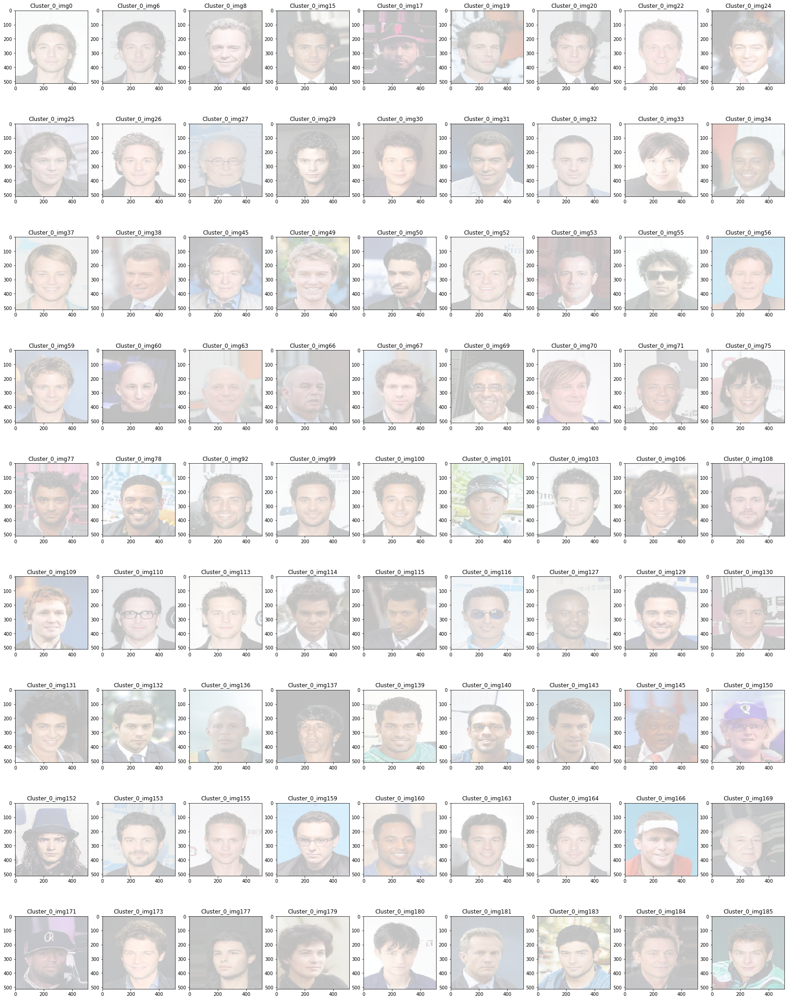

In [131]:
import matplotlib.pyplot as plt
w = 10
h = 10
fig = plt.figure(figsize=(30,40))
columns = 9
rows = 9
ax=[]
i=0
for i in range(81):
    
    
        index=a[i]
        #print(index)
        path=key_at_index[index]
        img=Image.open(path)

        ax.append(fig.add_subplot(rows,columns, i+1)) 
       
        ax[-1].set_title("Cluster_0_img{}".format(index))
        plt.imshow(img, alpha=0.25)
        i=i+1
plt.show()

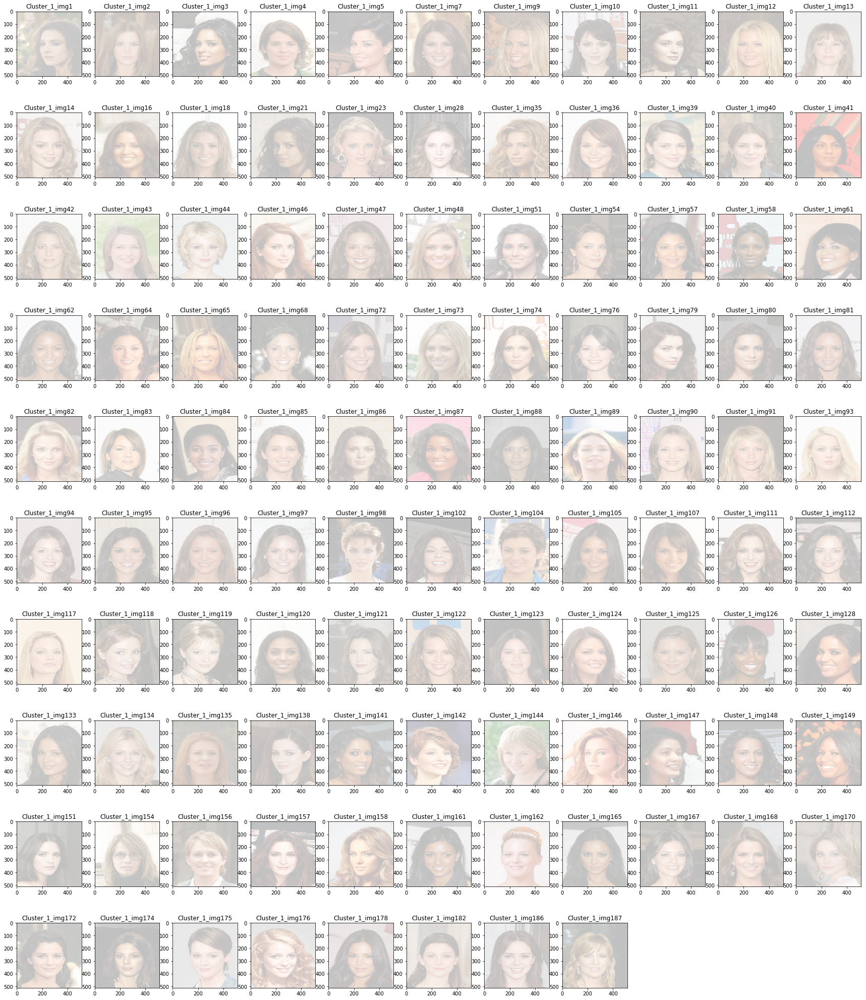

In [130]:
rows=11
columns=11
ax=[]
fig = plt.figure(figsize=(30,40))
for i in range(len(b)):
    
    
        index=b[i]
        #print(index)
        path=key_at_index[index]
        img=Image.open(path)

        ax.append(fig.add_subplot(rows,columns, i+1)) 
       
        ax[-1].set_title("Cluster_1_img{}".format(index))
        plt.imshow(img, alpha=0.25)
        i=i+1
plt.show()

# Function to print all the clusters 

In [151]:
def printing_images(n_clusters):
    rows=11
    columns=11
    
    for i in range (n_clusters):
        ax=[]
        fig = plt.figure(figsize=(30,40))
        a=mydict.get(i)
        print("________New Cluster_{}________________".format(i))
        for j in range (len(a)):
            index=a[j]
            #print(index)
            path=key_at_index[index]
            img=Image.open(path)

            ax.append(fig.add_subplot(rows,columns, j+1)) 
       
            ax[-1].set_title("Image_{}".format(index))
            plt.imshow(img, alpha=0.25)
            i=i+1
            
             
        plt.show()
            
        

________New Cluster_0________________


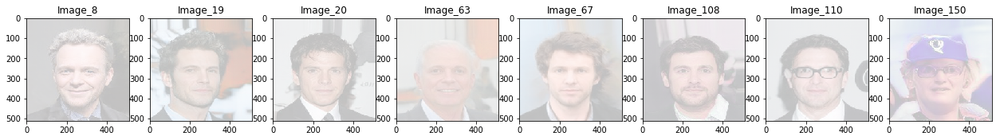

________New Cluster_1________________


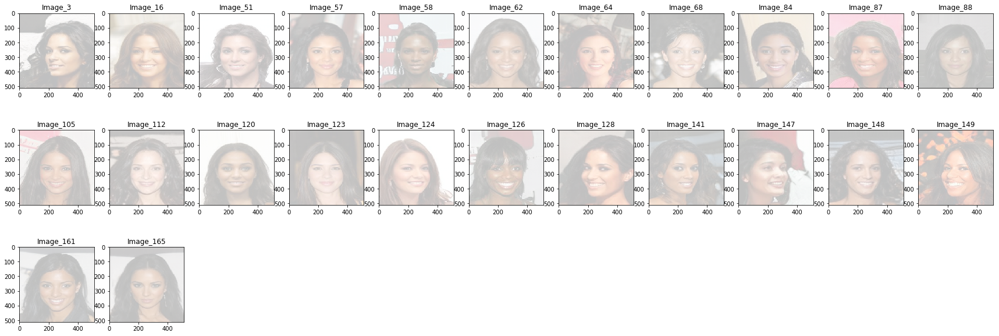

________New Cluster_2________________


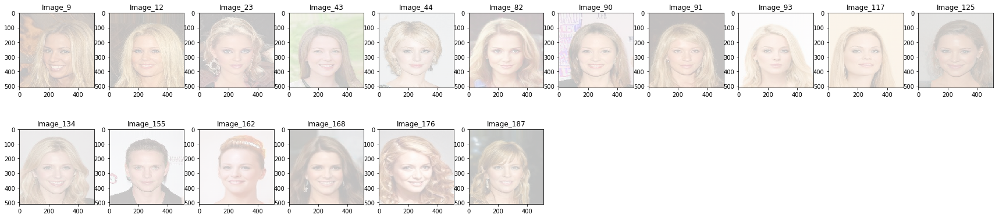

________New Cluster_3________________


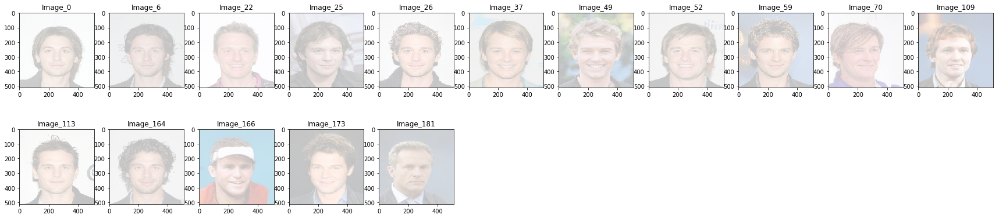

________New Cluster_4________________


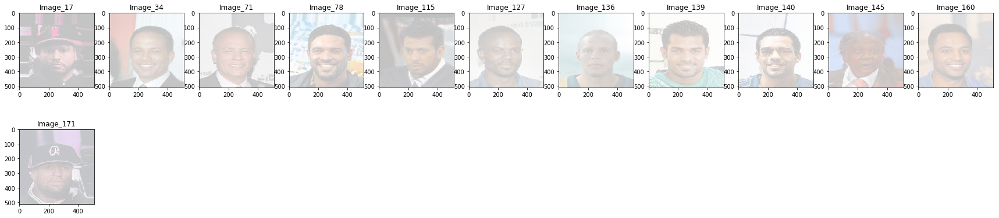

________New Cluster_5________________


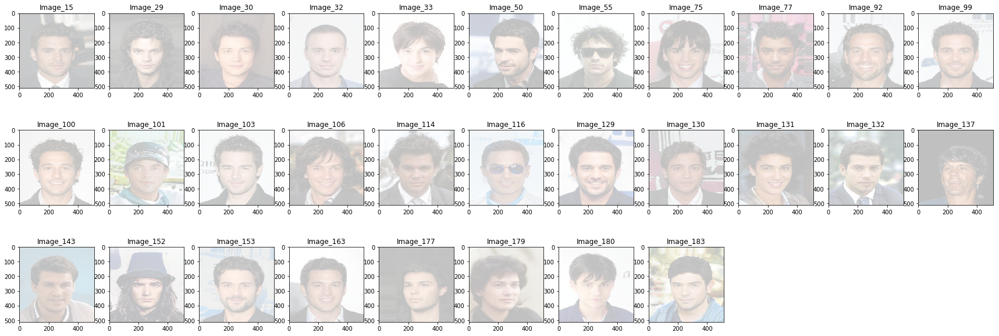

________New Cluster_6________________


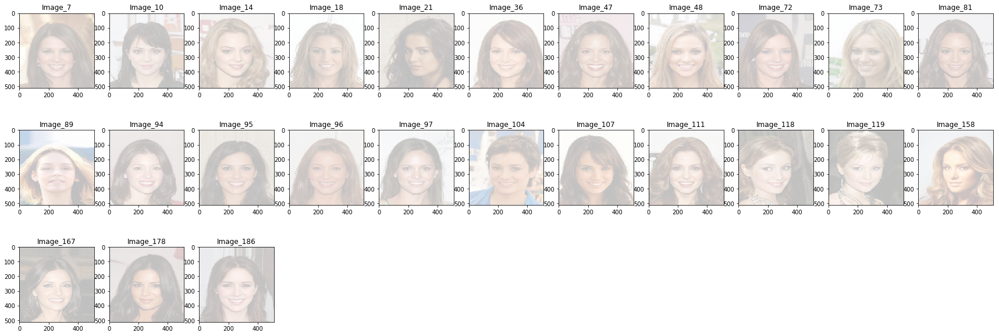

________New Cluster_7________________


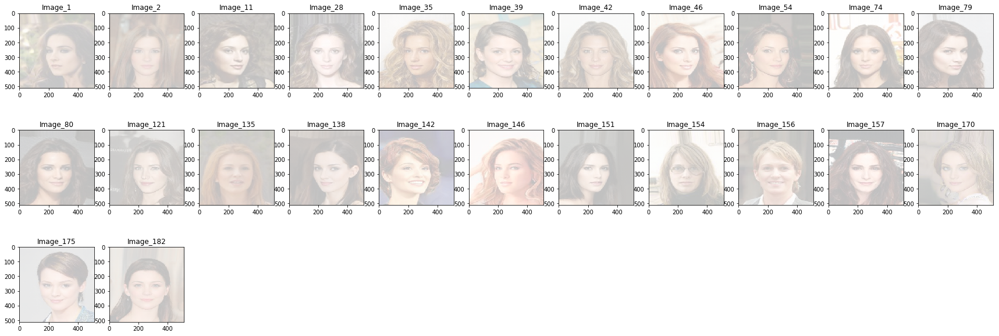

________New Cluster_8________________


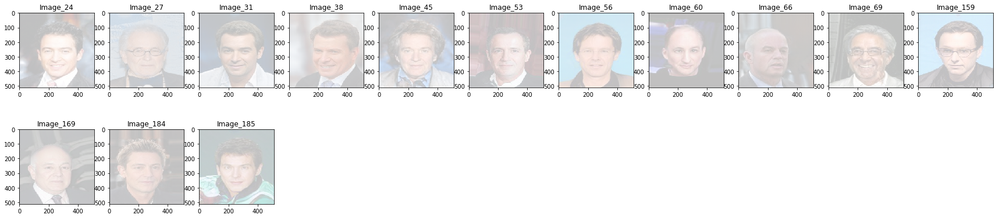

________New Cluster_9________________


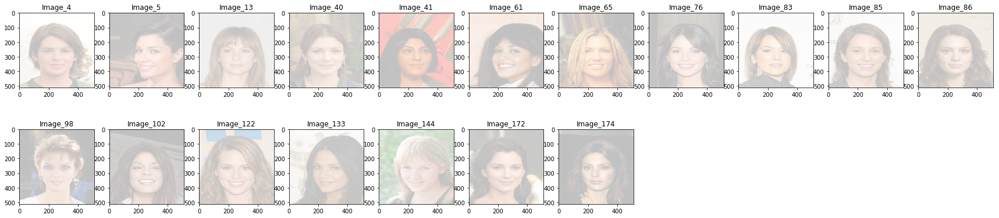

In [170]:
printing_images(10)

Good method will be to select the cluster centres individually and then implement the K means algorithm